# EDGS: Eliminating Densification for Gaussian Splatting
EDGS improves 3D Gaussian Splatting by removing the need for densification. It starts from a dense point cloud initialization based on 2D correspondences, leading to:
- ⚡ Faster convergence (only 25% of training time)
 - 🌀 Higher rendering quality
 - 💡 No need for progressive densification

## 1. Installation

In [ ]:
# Clone repo and initialize submodules
!git clone https://github.com/CompVis/EDGS.git --recursive
%cd EDGS

# Create and activate conda environment (if using a local runtime)
# For Colab, we use pip-based installs
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install -e submodules/gaussian-splatting/submodules/diff-gaussian-rasterization
!pip install -e submodules/gaussian-splatting/submodules/simple-knn
!pip install wandb hydra-core tqdm torchmetrics lpips matplotlib rich plyfile
!pip install -e submodules/RoMa

!pip install pycolmap
!pip install wandb hydra-core tqdm torchmetrics lpips matplotlib rich plyfile imageio imageio-ffmpeg
# Stuff necessary for gradio and visualizations
!pip install gradio 
!pip install plotly scikit-learn moviepy==2.1.1 ffmpeg
!pip install opencv-python


: 

: 

: 

In [ ]:
%cd notebooks

## 2. Import libraries

In [ ]:
import torch
import numpy as np
from matplotlib import pyplot as plt
# Enable interactive mode
# %matplotlib ipympl
%matplotlib inline

import sys
import os
sys.path.append("../")
sys.path.append("../submodules/gaussian-splatting")
from source.utils_aux import set_seed
import omegaconf
import wandb
import hydra
from hydra import initialize, compose
import random

from omegaconf import OmegaConf
from source.trainer import EDGSTrainer

In [ ]:
with initialize(config_path="configs", version_base="1.1"):
    cfg = compose(config_name="train")
print(OmegaConf.to_yaml(cfg))

gs:
  _target_: source.networks.Warper3DGS
  verbose: true
  viewpoint_stack: null
  sh_degree: 3
  opt:
    iterations: 30000
    position_lr_init: 0.00016
    position_lr_final: 1.6e-06
    position_lr_delay_mult: 0.01
    position_lr_max_steps: 30000
    feature_lr: 0.0025
    opacity_lr: 0.025
    scaling_lr: 0.005
    rotation_lr: 0.001
    percent_dense: 0.01
    lambda_dssim: 0.2
    densification_interval: 100
    opacity_reset_interval: 30000
    densify_from_iter: 500
    densify_until_iter: 15000
    densify_grad_threshold: 0.0002
    random_background: false
    save_iterations:
    - 3000
    - 7000
    - 15000
    - 30000
    batch_size: 64
    exposure_lr_init: 0.01
    exposure_lr_final: 0.0001
    exposure_lr_delay_steps: 0
    exposure_lr_delay_mult: 0.0
    TRAIN_CAM_IDX_TO_LOG: 50
    TEST_CAM_IDX_TO_LOG: 10
  pipe:
    convert_SHs_python: false
    compute_cov3D_python: false
    debug: false
    antialiasing: false
  dataset:
    densify_until_iter: 15000
    sour

# 3. Init input parameters 

## 3.1 Optionally preprocess video

In [ ]:
# PATH_TO_VIDEO = "assets/examples/video_fruits.mp4"
PATH_TO_IMAGES = "data/bear"
num_ref_views = 16 # how many frames you want to extract from video and colmap
num_corrs = 20000
if True:
    # Full pipeline helpers
    import shutil
    from gradio_demo import preprocess_input
    from source.utils_preprocess import read_video_frames, preprocess_frames, select_optimal_frames, save_frames_to_scene_dir, run_colmap_on_scene
    from source.visualization import generate_circular_camera_path, save_numpy_frames_as_mp4, generate_fully_smooth_cameras_with_tsp, put_text_on_image
    # Change to your path
    images, scene_dir = preprocess_input(PATH_TO_VIDEO, num_ref_views, num_corrs)
    os.makedirs('assets/video_colmaped', exist_ok=True)
    shutil.copytree(scene_dir, 'assets/video_colmaped',  dirs_exist_ok=True)
    


/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Using coarse resolution (560, 560), and upsample res (864, 864)


Scoring frames: 100%|█████████████████████████████████████████████████████| 417/417 [00:02<00:00, 203.46it/s]


Saved 16 frames to /tmp/tmpdwzxgdcs/scene/images
Running COLMAP pipeline on all images inside /tmp/tmpdwzxgdcs/scene


I20250502 12:53:15.958712 140639532443200 misc.cc:44] 
Feature extraction
I20250502 12:53:15.961187 140636992812608 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961213 140636984419904 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961233 140636976027200 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961817 140636489512512 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961853 140636481119808 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961888 140636464334400 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961887 140636472727104 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961910 140636455941696 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.961937 140636447548992 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:15.962047 140636439156288 sift.cc:727] Creating SIFT CPU feature extractor
I20250502 12:53:

Finished feature extraction in 0.37s.


I20250502 12:53:16.999872 140639532443200 feature_matching.cc:46] in 0.669s
I20250502 12:53:17.000267 140639532443200 timer.cc:91] Elapsed time: 0.011 [minutes]
I20250502 12:53:17.002410 140646013261632 incremental_pipeline.cc:237] Loading database
I20250502 12:53:17.002801 140646013261632 database_cache.cc:66] Loading cameras...
I20250502 12:53:17.002835 140646013261632 database_cache.cc:76]  16 in 0.000s
I20250502 12:53:17.002842 140646013261632 database_cache.cc:84] Loading matches...
I20250502 12:53:17.002955 140646013261632 database_cache.cc:89]  94 in 0.000s
I20250502 12:53:17.002970 140646013261632 database_cache.cc:105] Loading images...
I20250502 12:53:17.003241 140646013261632 database_cache.cc:153]  16 in 0.000s (connected 16)
I20250502 12:53:17.003263 140646013261632 database_cache.cc:164] Loading pose priors...
I20250502 12:53:17.003288 140646013261632 database_cache.cc:175]  0 in 0.000s
I20250502 12:53:17.003291 140646013261632 database_cache.cc:184] Building corresponden

Finished feature matching in 1.05s.


I20250502 12:53:17.540294 140646013261632 incremental_pipeline.cc:390] Registering image #2 (4)
I20250502 12:53:17.540334 140646013261632 incremental_pipeline.cc:393] => Image sees 446 / 1026 points
I20250502 12:53:17.697966 140646013261632 incremental_pipeline.cc:42] Retriangulation and Global bundle adjustment
I20250502 12:53:17.719149 140646013261632 incremental_pipeline.cc:390] Registering image #1 (5)
I20250502 12:53:17.719193 140646013261632 incremental_pipeline.cc:393] => Image sees 511 / 769 points
I20250502 12:53:17.789098 140646013261632 incremental_pipeline.cc:42] Retriangulation and Global bundle adjustment
I20250502 12:53:17.851449 140646013261632 incremental_pipeline.cc:390] Registering image #4 (6)
I20250502 12:53:17.851491 140646013261632 incremental_pipeline.cc:393] => Image sees 522 / 819 points
I20250502 12:53:17.903042 140646013261632 incremental_pipeline.cc:42] Retriangulation and Global bundle adjustment
I20250502 12:53:17.973468 140646013261632 incremental_pipeli

Finished incremental mapping in 3.49s.
Total pipeline time: 3.50s.


I20250502 12:53:19.448372 140646013261632 timer.cc:91] Elapsed time: 0.041 [minutes]


In [ ]:
# Update the config with your settings
cfg.wandb.name="EDGS.demo.scene"
cfg.wandb.mode="disabled" # "online" 
cfg.gs.dataset.model_path="./scene_edgsed_bear/"  # "change this to your path to the processed scene"
cfg.gs.dataset.source_path="data/bear" # "change this to your path"
# Optionally for video processed
# cfg.gs.dataset.source_path="../assets/video_colmaped/"
cfg.gs.dataset.images="images"
cfg.gs.opt.TEST_CAM_IDX_TO_LOG=12 
cfg.train.gs_epochs=30000
cfg.gs.opt.opacity_reset_interval=1_000_000
cfg.train.no_densify=True
cfg.init_wC.matches_per_ref=15_000
cfg.init_wC.nns_per_ref=3
cfg.init_wC.num_refs=180
cfg.init_wC.roma_model="indoors" 

# 4. Initilize model and logger

In [8]:
_ = wandb.init(entity=cfg.wandb.entity,
                   project=cfg.wandb.project,
                   config=omegaconf.OmegaConf.to_container(cfg, resolve=True, throw_on_missing=True),
                   name = cfg.wandb.name,
                   mode = cfg.wandb.mode)
omegaconf.OmegaConf.resolve(cfg)
set_seed(cfg.seed)
# Init output folder
print("Output folder: {}".format(cfg.gs.dataset.model_path))
os.makedirs(cfg.gs.dataset.model_path, exist_ok=True)
# Init gs model
gs = hydra.utils.instantiate(cfg.gs) 
trainer = EDGSTrainer(GS=gs,
                      training_config=cfg.gs.opt,
                      device=cfg.device)

Output folder: ./scene_edgsed/
Reading camera 16/16
Converting point3d.bin to .ply, will happen only the first time you open the scene.
Loading Training Cameras
Loading Test Cameras
Number of points at initialisation :  2201
Preparing train and test sets split...
Found no test_cameras for resolution 1.0. Move every 8th camera out ouf total 16 train cameras to the test set now
Done. Now train and test sets contain each 14 and 2 cameras respectively.
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/lpips/weights/v0.1/vgg.pth


/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/lpips/lpips.py:107: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.load_state_dict(torch.load(model_path, 

# 5. Init with matchings

In [9]:
trainer.timer.start()
trainer.init_with_corr(cfg.init_wC)
trainer.timer.pause() 

N_splats_at_init: 2201


/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Using coarse resolution (560, 560), and upsample res (864, 864)
Once run full roma_model.match warp.shape: torch.Size([560, 560, 4])
Once run full roma_model.match certainty_warp.shape: torch.Size([560, 560])


100%|████████████████████████████████████████████████████████████████████████| 14/14 [00:10<00:00,  1.31it/s]

N_splats_after_init: 212201


### Visualize a few initial viewpoints

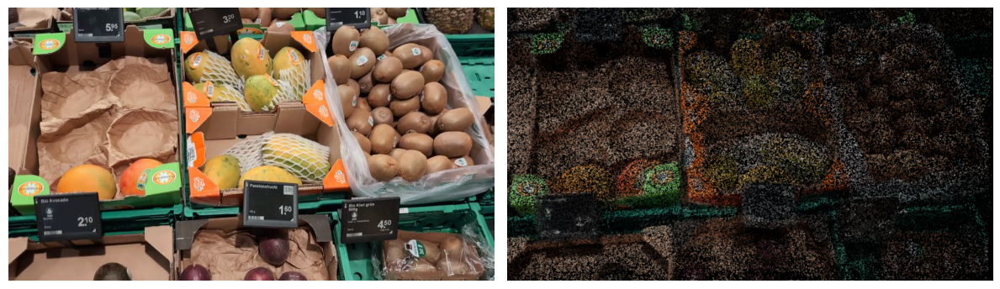

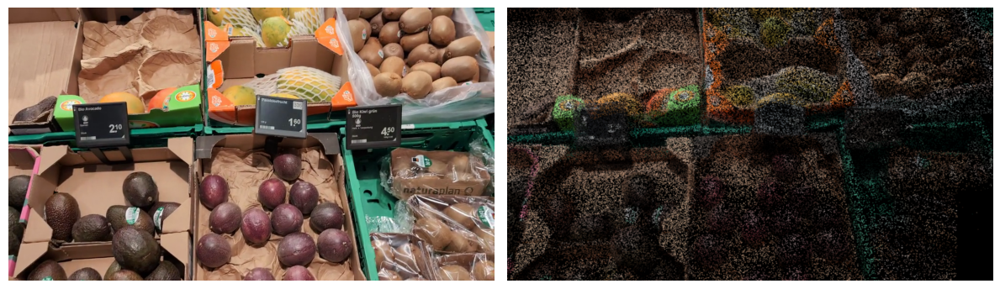

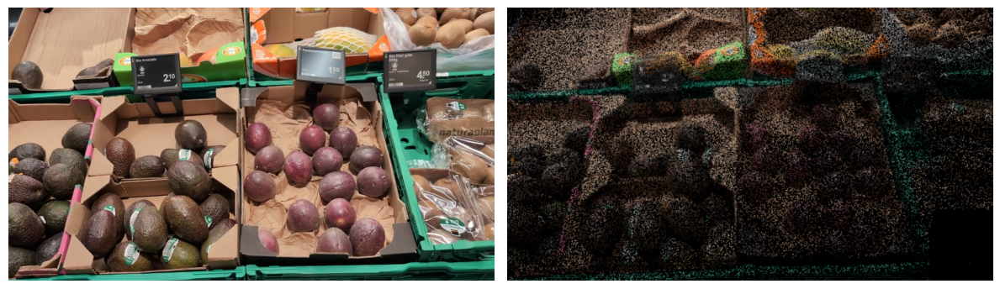

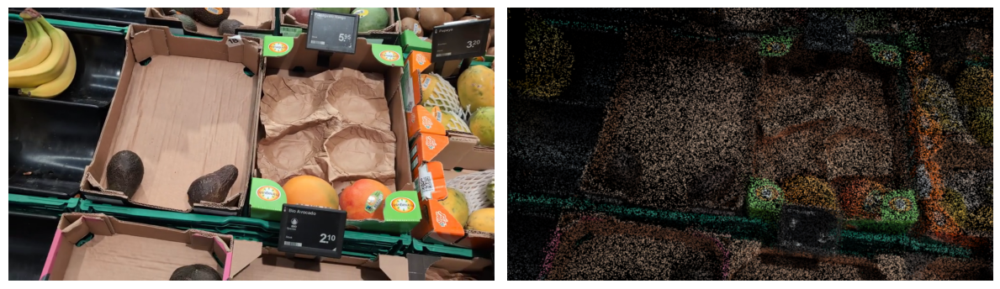

In [10]:
with torch.no_grad():
    viewpoint_stack = trainer.GS.scene.getTrainCameras()
    viewpoint_cams_to_viz = random.sample(trainer.GS.scene.getTrainCameras(), 4)
    for viewpoint_cam in viewpoint_cams_to_viz:
        render_pkg = trainer.GS(viewpoint_cam)
        image = render_pkg["render"]
        
        image_np = image.clone().detach().cpu().numpy().transpose(1, 2, 0)
        image_gt_np = viewpoint_cam.original_image.clone().detach().cpu().numpy().transpose(1, 2, 0)
    
        # Clip values to be in the range [0, 1]
        image_np = np.clip(image_np*255, 0, 255).astype(np.uint8) 
        image_gt_np = np.clip(image_gt_np*255, 0, 255).astype(np.uint8)  
    
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
        ax[0].imshow(image_gt_np)
        ax[0].axis("off")
        ax[1].imshow(image_np)
        ax[1].axis("off")
        plt.tight_layout()
        plt.show()       

# 6.Optimize scene
Optimize first briefly for 5k steps and visualize results. We also disable saving of pretrained models. Train function can be changed for any other method

In [11]:
trainer.saving_iterations = []
cfg.train.gs_epochs=5_000
trainer.train(cfg.train)

Train 3DGS for 5000 iterations

Output()

/home/scymz2/miniconda3/envs/edgs/lib/python3.10/site-packages/tqdm/rich.py:146: TqdmExperimentalWarning: rich is experimental/alpha
  return tqdm_rich(range(*args), **kwargs)


[ITER 500], #209908 gaussians, Evaluating test: L1=0.050329,  PSNR=21.345531, SSIM=0.747562, LPIPS_splat=0.229798 

[ITER 500], #209908 gaussians, Evaluating train: L1=0.034096,  PSNR=24.941559, SSIM=0.883347, LPIPS_splat=0.132480 

[ITER 1000], #209907 gaussians, Evaluating test: L1=0.045087,  PSNR=22.260509, SSIM=0.765956, LPIPS_splat=0.202548 

[ITER 1000], #209907 gaussians, Evaluating train: L1=0.025968,  PSNR=27.269825, SSIM=0.914295, LPIPS_splat=0.100696 

[ITER 1500], #209856 gaussians, Evaluating test: L1=0.042801,  PSNR=22.552685, SSIM=0.772843, LPIPS_splat=0.191712 

[ITER 1500], #209856 gaussians, Evaluating train: L1=0.020842,  PSNR=29.147048, SSIM=0.930553, LPIPS_splat=0.083913 

[ITER 2000], #209605 gaussians, Evaluating test: L1=0.042236,  PSNR=22.555588, SSIM=0.775123, LPIPS_splat=0.187079 

[ITER 2000], #209605 gaussians, Evaluating train: L1=0.018691,  PSNR=30.016723, SSIM=0.938333, LPIPS_splat=0.075826 

[ITER 2500], #209059 gaussians, Evaluating test: L1=0.042141,  PSNR=22.542756, SSIM=0.774990, LPIPS_splat=0.183798 

[ITER 2500], #209059 gaussians, Evaluating train: L1=0.016687,  PSNR=30.877317, SSIM=0.945216, LPIPS_splat=0.068289 

[ITER 3000], #208243 gaussians, Evaluating test: L1=0.042385,  PSNR=22.522522, SSIM=0.776217, LPIPS_splat=0.180742 

[ITER 3000], #208243 gaussians, Evaluating train: L1=0.015670,  PSNR=31.361792, SSIM=0.949439, LPIPS_splat=0.063998 

[ITER 3228], #207898 gaussians, Evaluating test: L1=0.042014,  PSNR=22.548887, SSIM=0.777869, LPIPS_splat=0.178510 

[ITER 3228], #207898 gaussians, Evaluating train: L1=0.015036,  PSNR=31.624599, SSIM=0.951650, LPIPS_splat=0.061367 

[ITER 4228], #206233 gaussians, Evaluating test: L1=0.041954,  PSNR=22.515835, SSIM=0.778789, LPIPS_splat=0.174892 

[ITER 4228], #206233 gaussians, Evaluating train: L1=0.013699,  PSNR=32.406499, SSIM=0.957312, LPIPS_splat=0.055404 

### Visualize same viewpoints

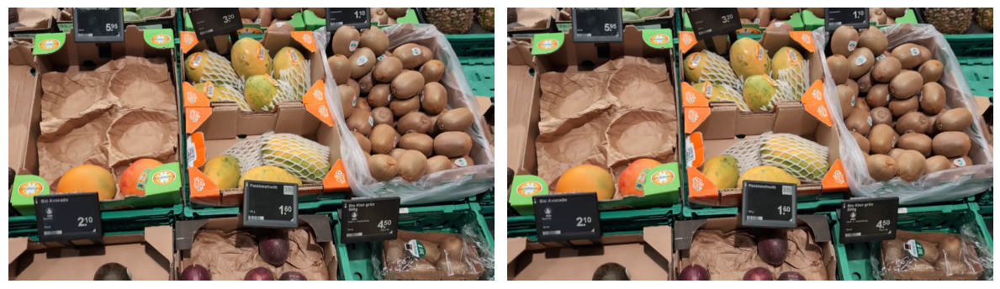

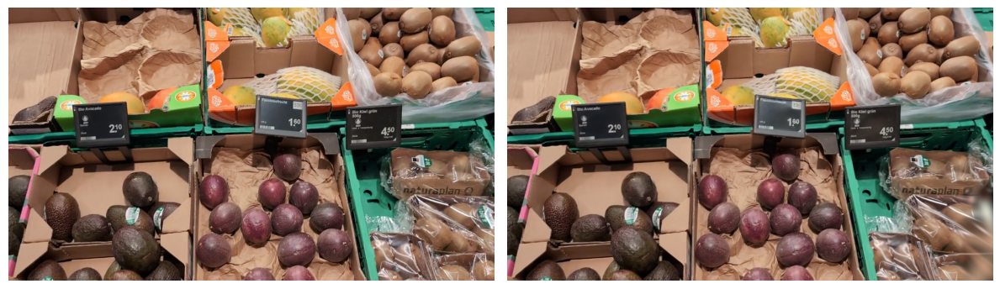

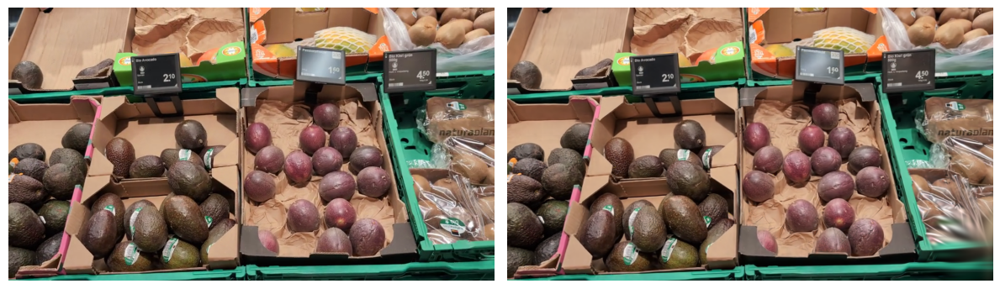

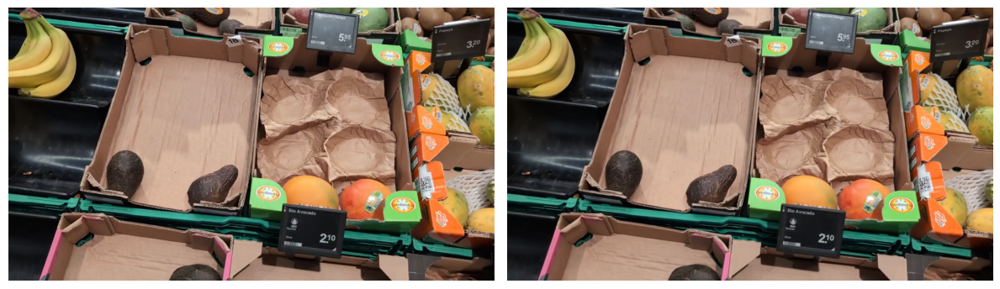

In [12]:
with torch.no_grad():
    for viewpoint_cam in viewpoint_cams_to_viz:
        render_pkg = trainer.GS(viewpoint_cam)
        image = render_pkg["render"]
    
        image_np = image.clone().detach().cpu().numpy().transpose(1, 2, 0)
        image_gt_np = viewpoint_cam.original_image.clone().detach().cpu().numpy().transpose(1, 2, 0)
    
        # Clip values to be in the range [0, 1]
        image_np = np.clip(image_np*255, 0, 255).astype(np.uint8) 
        image_gt_np = np.clip(image_gt_np*255, 0, 255).astype(np.uint8)  
        
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
        ax[0].imshow(image_gt_np)
        ax[0].axis("off")
        ax[1].imshow(image_np)
        ax[1].axis("off")
        plt.tight_layout()
        plt.show()

### Save model

In [31]:
with torch.no_grad():
    trainer.save_model()


[ITER 5000] Saving Gaussians

[ITER 5000] Saving Checkpoint


# 7. Continue training until we reach total 30K training steps

In [13]:
cfg.train.gs_epochs=25_000
trainer.train(cfg.train)

Train 3DGS for 25000 iterations

Output()

[ITER 5228], #204794 gaussians, Evaluating test: L1=0.041536,  PSNR=22.506783, SSIM=0.778415, LPIPS_splat=0.174222 

[ITER 5228], #204794 gaussians, Evaluating train: L1=0.012991,  PSNR=32.844506, SSIM=0.960324, LPIPS_splat=0.052110 

[ITER 6228], #203486 gaussians, Evaluating test: L1=0.041690,  PSNR=22.477551, SSIM=0.778480, LPIPS_splat=0.173690 

[ITER 6228], #203486 gaussians, Evaluating train: L1=0.012503,  PSNR=33.218524, SSIM=0.962777, LPIPS_splat=0.049985 

[ITER 7228], #202437 gaussians, Evaluating test: L1=0.041972,  PSNR=22.434969, SSIM=0.777371, LPIPS_splat=0.173879 

[ITER 7228], #202437 gaussians, Evaluating train: L1=0.012252,  PSNR=33.428920, SSIM=0.964096, LPIPS_splat=0.048076 

[ITER 8228], #201447 gaussians, Evaluating test: L1=0.041547,  PSNR=22.417099, SSIM=0.777014, LPIPS_splat=0.173493 

[ITER 8228], #201447 gaussians, Evaluating train: L1=0.011951,  PSNR=33.654870, SSIM=0.965484, LPIPS_splat=0.046532 

[ITER 9228], #200426 gaussians, Evaluating test: L1=0.042047,  PSNR=22.389575, SSIM=0.777113, LPIPS_splat=0.173354 

[ITER 9228], #200426 gaussians, Evaluating train: L1=0.011532,  PSNR=33.881377, SSIM=0.966708, LPIPS_splat=0.045048 

[ITER 10228], #199222 gaussians, Evaluating test: L1=0.042204,  PSNR=22.362736, SSIM=0.776624, LPIPS_splat=0.173376 

[ITER 10228], #199222 gaussians, Evaluating train: L1=0.011424,  PSNR=33.981642, SSIM=0.967368, LPIPS_splat=0.044085 

[ITER 11228], #198008 gaussians, Evaluating test: L1=0.042101,  PSNR=22.346050, SSIM=0.775673, LPIPS_splat=0.173869 

[ITER 11228], #198008 gaussians, Evaluating train: L1=0.011269,  PSNR=34.117874, SSIM=0.968154, LPIPS_splat=0.043176 

[ITER 12228], #196746 gaussians, Evaluating test: L1=0.042714,  PSNR=22.299500, SSIM=0.774612, LPIPS_splat=0.174122 

[ITER 12228], #196746 gaussians, Evaluating train: L1=0.011319,  PSNR=34.132900, SSIM=0.968474, LPIPS_splat=0.042455 

[ITER 13228], #195447 gaussians, Evaluating test: L1=0.042242,  PSNR=22.292435, SSIM=0.774306, LPIPS_splat=0.174328 

[ITER 13228], #195447 gaussians, Evaluating train: L1=0.010978,  PSNR=34.309604, SSIM=0.969174, LPIPS_splat=0.041796 

[ITER 14228], #194252 gaussians, Evaluating test: L1=0.042568,  PSNR=22.265987, SSIM=0.773393, LPIPS_splat=0.174303 

[ITER 14228], #194252 gaussians, Evaluating train: L1=0.011369,  PSNR=34.193267, SSIM=0.969232, LPIPS_splat=0.041576 

[ITER 15228], #193364 gaussians, Evaluating test: L1=0.043009,  PSNR=22.203623, SSIM=0.771638, LPIPS_splat=0.175026 

[ITER 15228], #193364 gaussians, Evaluating train: L1=0.010703,  PSNR=34.508978, SSIM=0.970288, LPIPS_splat=0.039825 

[ITER 16228], #193364 gaussians, Evaluating test: L1=0.043122,  PSNR=22.184077, SSIM=0.769815, LPIPS_splat=0.176259 

[ITER 16228], #193364 gaussians, Evaluating train: L1=0.010737,  PSNR=34.533710, SSIM=0.970601, LPIPS_splat=0.038877 

[ITER 17228], #193364 gaussians, Evaluating test: L1=0.042983,  PSNR=22.170403, SSIM=0.769922, LPIPS_splat=0.176290 

[ITER 17228], #193364 gaussians, Evaluating train: L1=0.010653,  PSNR=34.621198, SSIM=0.971137, LPIPS_splat=0.038558 

[ITER 18228], #193364 gaussians, Evaluating test: L1=0.043049,  PSNR=22.153232, SSIM=0.768994, LPIPS_splat=0.176625 

[ITER 18228], #193364 gaussians, Evaluating train: L1=0.010402,  PSNR=34.735344, SSIM=0.971631, LPIPS_splat=0.037779 

[ITER 19228], #193364 gaussians, Evaluating test: L1=0.043373,  PSNR=22.118054, SSIM=0.767923, LPIPS_splat=0.177315 

[ITER 19228], #193364 gaussians, Evaluating train: L1=0.010499,  PSNR=34.710758, SSIM=0.971592, LPIPS_splat=0.037648 

[ITER 20228], #193364 gaussians, Evaluating test: L1=0.043067,  PSNR=22.140858, SSIM=0.767846, LPIPS_splat=0.177506 

[ITER 20228], #193364 gaussians, Evaluating train: L1=0.010121,  PSNR=34.887300, SSIM=0.972279, LPIPS_splat=0.037002 

[ITER 21228], #193364 gaussians, Evaluating test: L1=0.043157,  PSNR=22.125263, SSIM=0.767410, LPIPS_splat=0.177724 

[ITER 21228], #193364 gaussians, Evaluating train: L1=0.010181,  PSNR=34.895958, SSIM=0.972450, LPIPS_splat=0.036751 

[ITER 22228], #193364 gaussians, Evaluating test: L1=0.043228,  PSNR=22.107236, SSIM=0.766900, LPIPS_splat=0.178300 

[ITER 22228], #193364 gaussians, Evaluating train: L1=0.010020,  PSNR=34.968124, SSIM=0.972699, LPIPS_splat=0.036348 

[ITER 23228], #193364 gaussians, Evaluating test: L1=0.043400,  PSNR=22.084001, SSIM=0.766687, LPIPS_splat=0.178518 

[ITER 23228], #193364 gaussians, Evaluating train: L1=0.009914,  PSNR=35.024683, SSIM=0.973047, LPIPS_splat=0.035892 

[ITER 24228], #193364 gaussians, Evaluating test: L1=0.043554,  PSNR=22.082601, SSIM=0.766262, LPIPS_splat=0.178742 

[ITER 24228], #193364 gaussians, Evaluating train: L1=0.009838,  PSNR=35.083847, SSIM=0.973240, LPIPS_splat=0.035745 

[ITER 25228], #193364 gaussians, Evaluating test: L1=0.043448,  PSNR=22.082472, SSIM=0.766137, LPIPS_splat=0.178870 

[ITER 25228], #193364 gaussians, Evaluating train: L1=0.009671,  PSNR=35.161343, SSIM=0.973523, LPIPS_splat=0.035347 

[ITER 26228], #193364 gaussians, Evaluating test: L1=0.043455,  PSNR=22.065761, SSIM=0.765414, LPIPS_splat=0.179578 

[ITER 26228], #193364 gaussians, Evaluating train: L1=0.009735,  PSNR=35.146896, SSIM=0.973517, LPIPS_splat=0.035251 

[ITER 27228], #193364 gaussians, Evaluating test: L1=0.043505,  PSNR=22.068808, SSIM=0.765501, LPIPS_splat=0.179484 

[ITER 27228], #193364 gaussians, Evaluating train: L1=0.009601,  PSNR=35.181593, SSIM=0.973784, LPIPS_splat=0.034967 

[ITER 28228], #193364 gaussians, Evaluating test: L1=0.043788,  PSNR=22.045277, SSIM=0.765130, LPIPS_splat=0.179816 

[ITER 28228], #193364 gaussians, Evaluating train: L1=0.009571,  PSNR=35.234006, SSIM=0.974018, LPIPS_splat=0.034585 

[ITER 29228], #193364 gaussians, Evaluating test: L1=0.043501,  PSNR=22.041494, SSIM=0.764563, LPIPS_splat=0.180355 

[ITER 29228], #193364 gaussians, Evaluating train: L1=0.009788,  PSNR=35.165682, SSIM=0.973933, LPIPS_splat=0.034665 

### Visualize same viewpoints

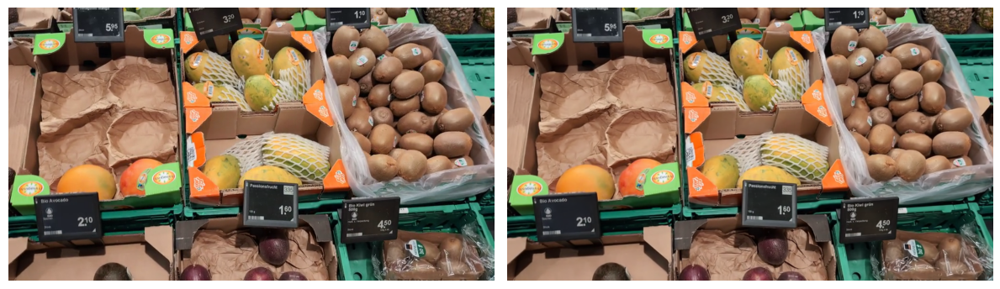

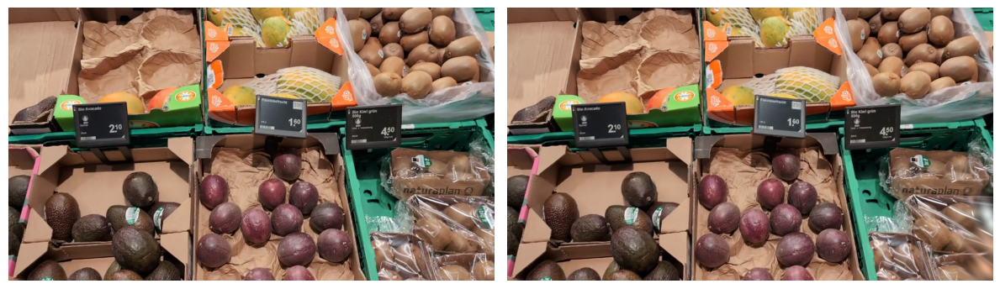

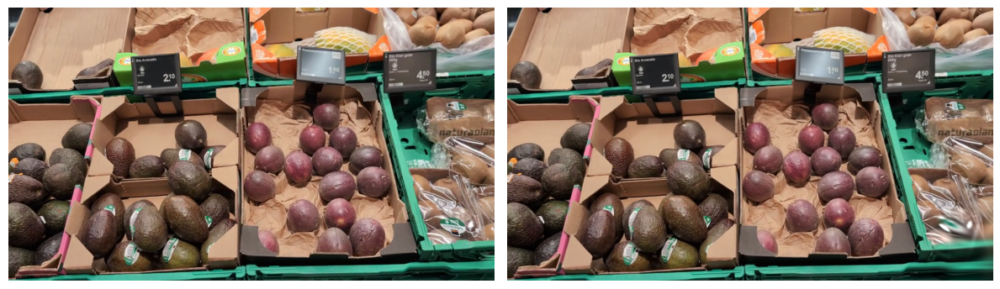

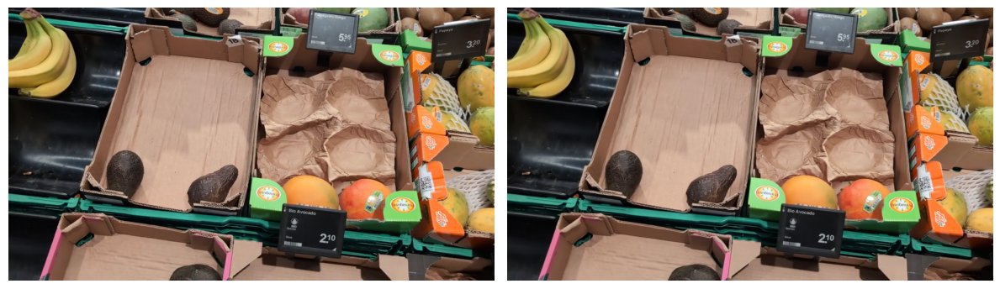

In [14]:
with torch.no_grad():
    for viewpoint_cam in viewpoint_cams_to_viz:
        render_pkg = trainer.GS(viewpoint_cam)
        image = render_pkg["render"]
    
        image_np = image.clone().detach().cpu().numpy().transpose(1, 2, 0)
        image_gt_np = viewpoint_cam.original_image.clone().detach().cpu().numpy().transpose(1, 2, 0)
    
        # Clip values to be in the range [0, 1]
        image_np = np.clip(image_np*255, 0, 255).astype(np.uint8) 
        image_gt_np = np.clip(image_gt_np*255, 0, 255).astype(np.uint8)  
        
        fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
        ax[0].imshow(image_gt_np)
        ax[0].axis("off")
        ax[1].imshow(image_np)
        ax[1].axis("off")
        plt.tight_layout()
        plt.show()

### Save model

In [15]:
with torch.no_grad():
    trainer.save_model()


[ITER 30000] Saving Gaussians

[ITER 30000] Saving Checkpoint
